In [1]:
import glob
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from sklearn.utils import shuffle
import time
from scipy.ndimage.measurements import label

In [2]:
GTI_Far_vehicles         = glob.glob('vehicles/GTI_Far/*png')
GTI_Left_vehicles        = glob.glob('vehicles/GTI_Left/*png')
GTI_MiddleClose_vehicles = glob.glob('vehicles/GTI_MiddleClose/*png')
GTI_Right_vehicles       = glob.glob('vehicles/GTI_Right/*png')
KITTI_extracted_vehicles = glob.glob('vehicles/KITTI_extracted/*png')
Extra_non_vehicles       = glob.glob('non-vehicles/Extras/*png')
GTI_non_vehicles         = glob.glob('non-vehicles/GTI/*png')

In [3]:
print('In vehicle folders:')
print('# of images in GTI_Far:', len(GTI_Far_vehicles))
print('# of images in GTI_Left:', len(GTI_Left_vehicles))
print('# of images in GTI_MiddleClose:', len(GTI_MiddleClose_vehicles))
print('# of images in GTI_Right:', len(GTI_Right_vehicles))
print('# of images in KITTI_extracted:', len(KITTI_extracted_vehicles))

print('\nIn non vehicle folders:')
print('# of images in Extra:', len(Extra_non_vehicles))
print('# of images in GTI:', len(GTI_non_vehicles))

example_img = cv2.imread(GTI_Far_vehicles[1])
print('\nImage size:', example_img.shape)

In vehicle folders:
# of images in GTI_Far: 834
# of images in GTI_Left: 909
# of images in GTI_MiddleClose: 419
# of images in GTI_Right: 664
# of images in KITTI_extracted: 5966

In non vehicle folders:
# of images in Extra: 5068
# of images in GTI: 3900

Image size: (64, 64, 3)


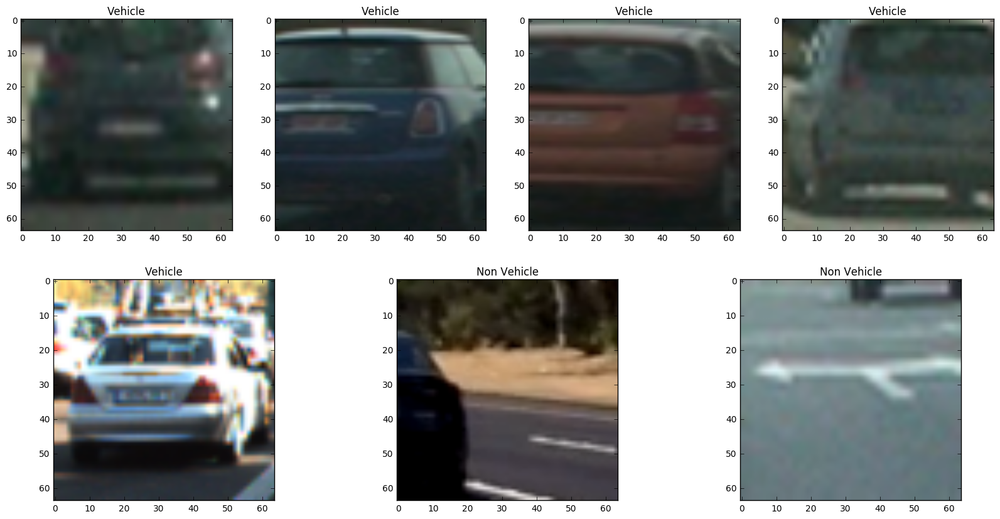

In [4]:
pos1 = np.random.randint(0, len(GTI_Far_vehicles))
img1 = cv2.imread(GTI_Far_vehicles[pos1])
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

pos2 = np.random.randint(0, len(GTI_Left_vehicles))
img2 = cv2.imread(GTI_Left_vehicles[pos2])
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

pos3 = np.random.randint(0, len(GTI_MiddleClose_vehicles))
img3 = cv2.imread(GTI_MiddleClose_vehicles[pos3])
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

pos4 = np.random.randint(0, len(GTI_Right_vehicles))
img4 = cv2.imread(GTI_Right_vehicles[pos4])
img4 = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)

pos5 = np.random.randint(0, len(KITTI_extracted_vehicles))
img5 = cv2.imread(KITTI_extracted_vehicles[pos5])
img5 = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)

pos6 = np.random.randint(0, len(Extra_non_vehicles))
img6 = cv2.imread(Extra_non_vehicles[pos6])
img6 = cv2.cvtColor(img6, cv2.COLOR_BGR2RGB)

pos7 = np.random.randint(0, len(GTI_non_vehicles))
img7 = cv2.imread(GTI_non_vehicles[pos7])
img7 = cv2.cvtColor(img7, cv2.COLOR_BGR2RGB)

plt.figure(figsize = (20,10))

plt.subplot(2,4,1)
plt.title('Vehicle')
plt.imshow(img1)

plt.subplot(2,4,2)
plt.title('Vehicle')
plt.imshow(img2)

plt.subplot(2,4,3)
plt.title('Vehicle')
plt.imshow(img3)

plt.subplot(2,4,4)
plt.title('Vehicle')
plt.imshow(img4)

plt.subplot(2,3,4)
plt.title('Vehicle')
plt.imshow(img5)

plt.subplot(2,3,5)
plt.title('Non Vehicle')
plt.imshow(img6)

plt.subplot(2,3,6)
plt.title('Non Vehicle')
plt.imshow(img7)
plt.show()

In [5]:
def color_hist(img, nbins = 64, bins_range = (0,256), color_space = 'RGB'):
    if color_space != 'RGB':
        if color_space == 'HSV':
            #print('Converting to HSV.....')
            img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            #print('Converting to LUV.....')
            img = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'YCrCb':
            #print('Converting to YCrCb.....')
            img = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
        elif color_space == 'HLS':
            #print('Converting to HLS.....')
            img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        
    ch1_hist = np.histogram(img[:,:,0], bins = nbins, range = bins_range)
    ch2_hist = np.histogram(img[:,:,1], bins = nbins, range = bins_range)
    ch3_hist = np.histogram(img[:,:,2], bins = nbins, range = bins_range)
    bin_edge = ch1_hist[1]
    bin_centers = (bin_edge[1:] + bin_edge[0:len(bin_edge)-1])/2
    hist_features = np.concatenate((ch1_hist[0], ch2_hist[0], ch3_hist[0]))
    return ch1_hist, ch2_hist, ch3_hist, bin_centers, hist_features

In [6]:
rh1, gh1, bh1, bincen1, hist_features1 = color_hist(img1)
rh2, gh2, bh2, bincen2, hist_features2 = color_hist(img2)
rh3, gh3, bh3, bincen3, hist_features3 = color_hist(img3)
rh4, gh4, bh4, bincen4, hist_features4 = color_hist(img4)
rh5, gh5, bh5, bincen5, hist_features5 = color_hist(img5)
rh6, gh6, bh6, bincen6, hist_features6 = color_hist(img6)
rh7, gh7, bh7, bincen7, hist_features7 = color_hist(img7)

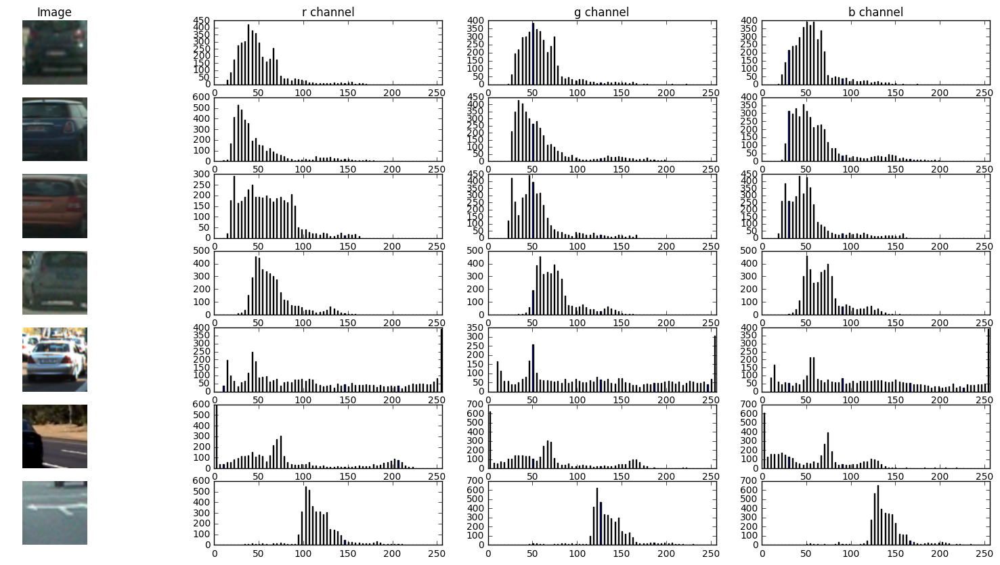

In [7]:
plt.figure(figsize = (20,10))
plt.subplot(7,4,1)
plt.title('Image')
plt.axis('off')
plt.imshow(img1)

plt.subplot(7,4,2)
plt.title('r channel')
plt.bar(bincen1, rh1[0])
plt.xlim(0,256)

plt.subplot(7,4,3)
plt.title('g channel')
plt.bar(bincen1, gh1[0])
plt.xlim(0,256)

plt.subplot(7,4,4)
plt.title('b channel')
plt.bar(bincen1, bh1[0])
plt.xlim(0,256)

plt.subplot(7,4,5)
plt.axis('off')
plt.imshow(img2)

plt.subplot(7,4,6)
plt.bar(bincen2, rh2[0])
plt.xlim(0,256)

plt.subplot(7,4,7)
plt.bar(bincen2, gh2[0])
plt.xlim(0,256)

plt.subplot(7,4,8)
plt.bar(bincen2, bh2[0])
plt.xlim(0,256)

plt.subplot(7,4,9)
plt.axis('off')
plt.imshow(img3)

plt.subplot(7,4,10)
plt.bar(bincen3, rh3[0])
plt.xlim(0,256)

plt.subplot(7,4,11)
plt.bar(bincen3, gh3[0])
plt.xlim(0,256)

plt.subplot(7,4,12)
plt.bar(bincen3, bh3[0])
plt.xlim(0,256)

plt.subplot(7,4,13)
plt.axis('off')
plt.imshow(img4)

plt.subplot(7,4,14)
plt.bar(bincen4, rh4[0])
plt.xlim(0,256)

plt.subplot(7,4,15)
plt.bar(bincen4, gh4[0])
plt.xlim(0,256)

plt.subplot(7,4,16)
plt.bar(bincen4, bh4[0])
plt.xlim(0,256)

plt.subplot(7,4,17)
plt.axis('off')
plt.imshow(img5)

plt.subplot(7,4,18)
plt.bar(bincen5, rh5[0])
plt.xlim(0,256)

plt.subplot(7,4,19)
plt.bar(bincen5, gh5[0])
plt.xlim(0,256)

plt.subplot(7,4,20)
plt.bar(bincen5, bh5[0])
plt.xlim(0,256)

plt.subplot(7,4,21)
plt.axis('off')
plt.imshow(img6)

plt.subplot(7,4,22)
plt.bar(bincen6, rh6[0])
plt.xlim(0,256)

plt.subplot(7,4,23)
plt.bar(bincen6, gh6[0])
plt.xlim(0,256)

plt.subplot(7,4,24)
plt.bar(bincen6, bh6[0])
plt.xlim(0,256)

plt.subplot(7,4,25)
plt.axis('off')
plt.imshow(img7)

plt.subplot(7,4,26)
plt.bar(bincen7, rh7[0])
plt.xlim(0,256)

plt.subplot(7,4,27)
plt.bar(bincen7, gh7[0])
plt.xlim(0,256)

plt.subplot(7,4,28)
plt.bar(bincen7, bh7[0])
plt.xlim(0,256)
plt.show()

In [8]:
hh1, sh1, vh1, bin_center1, HSV_features1 = color_hist(img1, color_space = 'HSV')
hh2, sh2, vh2, bin_center2, HSV_features2 = color_hist(img2, color_space = 'HSV')
hh3, sh3, vh3, bin_center3, HSV_features3 = color_hist(img3, color_space = 'HSV')
hh4, sh4, vh4, bin_center4, HSV_features4 = color_hist(img4, color_space = 'HSV')
hh5, sh5, vh5, bin_center5, HSV_features5 = color_hist(img5, color_space = 'HSV')
hh6, sh6, vh6, bin_center6, HSV_features6 = color_hist(img6, color_space = 'HSV')
hh7, sh7, vh7, bin_center7, HSV_features7 = color_hist(img7, color_space = 'HSV')

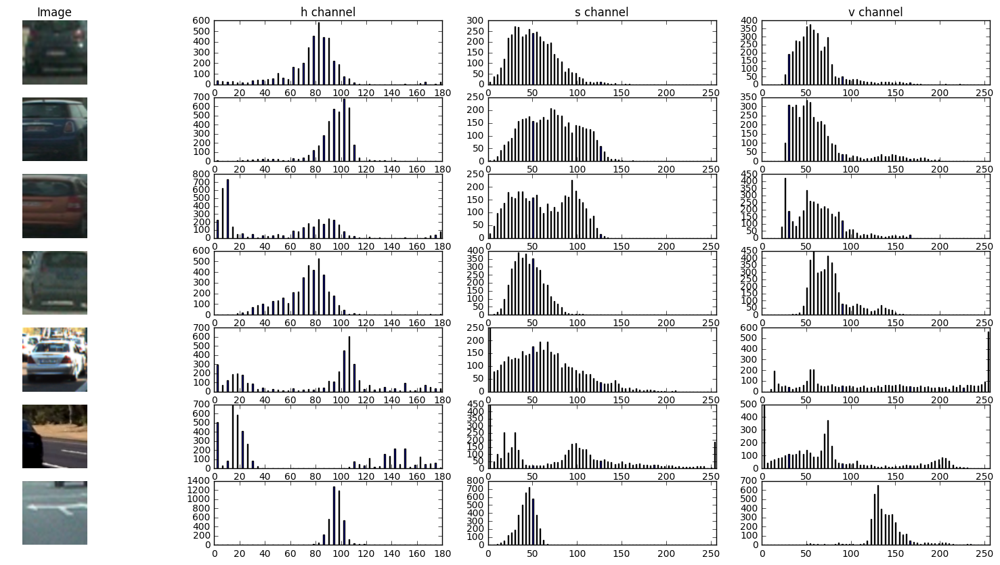

In [9]:
plt.figure(figsize = (20,10))
plt.subplot(7,4,1)
plt.title('Image')
plt.axis('off')
plt.imshow(img1)

plt.subplot(7,4,2)
plt.title('h channel')
plt.bar(bin_center1, hh1[0])
plt.xlim(0,180)

plt.subplot(7,4,3)
plt.title('s channel')
plt.bar(bin_center1, sh1[0])
plt.xlim(0,256)

plt.subplot(7,4,4)
plt.title('v channel')
plt.bar(bin_center1, vh1[0])
plt.xlim(0,256)

plt.subplot(7,4,5)
plt.axis('off')
plt.imshow(img2)

plt.subplot(7,4,6)
plt.bar(bin_center2, hh2[0])
plt.xlim(0,180)

plt.subplot(7,4,7)
plt.bar(bin_center2, sh2[0])
plt.xlim(0,256)

plt.subplot(7,4,8)
plt.bar(bin_center2, vh2[0])
plt.xlim(0,256)

plt.subplot(7,4,9)
plt.axis('off')
plt.imshow(img3)

plt.subplot(7,4,10)
plt.bar(bin_center3, hh3[0])
plt.xlim(0,180)

plt.subplot(7,4,11)
plt.bar(bin_center3, sh3[0])
plt.xlim(0,256)

plt.subplot(7,4,12)
plt.bar(bin_center3, vh3[0])
plt.xlim(0,256)

plt.subplot(7,4,13)
plt.axis('off')
plt.imshow(img4)

plt.subplot(7,4,14)
plt.bar(bin_center4, hh4[0])
plt.xlim(0,180)

plt.subplot(7,4,15)
plt.bar(bin_center4, sh4[0])
plt.xlim(0,256)

plt.subplot(7,4,16)
plt.bar(bin_center4, vh4[0])
plt.xlim(0,256)

plt.subplot(7,4,17)
plt.axis('off')
plt.imshow(img5)

plt.subplot(7,4,18)
plt.bar(bin_center5, hh5[0])
plt.xlim(0,180)

plt.subplot(7,4,19)
plt.bar(bin_center5, sh5[0])
plt.xlim(0,256)

plt.subplot(7,4,20)
plt.bar(bin_center5, vh5[0])
plt.xlim(0,256)

plt.subplot(7,4,21)
plt.axis('off')
plt.imshow(img6)

plt.subplot(7,4,22)
plt.bar(bin_center6, hh6[0])
plt.xlim(0,180)

plt.subplot(7,4,23)
plt.bar(bin_center6, sh6[0])
plt.xlim(0,256)

plt.subplot(7,4,24)
plt.bar(bin_center6, vh6[0])
plt.xlim(0,256)

plt.subplot(7,4,25)
plt.axis('off')
plt.imshow(img7)

plt.subplot(7,4,26)
plt.bar(bin_center7, hh7[0])
plt.xlim(0,180)

plt.subplot(7,4,27)
plt.bar(bin_center7, sh7[0])
plt.xlim(0,256)

plt.subplot(7,4,28)
plt.bar(bin_center7, vh7[0])
plt.xlim(0,256)
plt.show()

In [10]:
Yh1, Crh1, Cbh1, bin_center1, YCrCb_features1 = color_hist(img1, color_space = 'YCrCb')
Yh2, Crh2, Cbh2, bin_center2, YCrCb_features2 = color_hist(img2, color_space = 'YCrCb')
Yh3, Crh3, Cbh3, bin_center3, YCrCb_features3 = color_hist(img3, color_space = 'YCrCb')
Yh4, Crh4, Cbh4, bin_center4, YCrCb_features4 = color_hist(img4, color_space = 'YCrCb')
Yh5, Crh5, Cbh5, bin_center5, YCrCb_features5 = color_hist(img5, color_space = 'YCrCb')
Yh6, Crh6, Cbh6, bin_center6, YCrCb_features6 = color_hist(img6, color_space = 'YCrCb')
Yh7, Crh7, Cbh7, bin_center7, YCrCb_features7 = color_hist(img7, color_space = 'YCrCb')

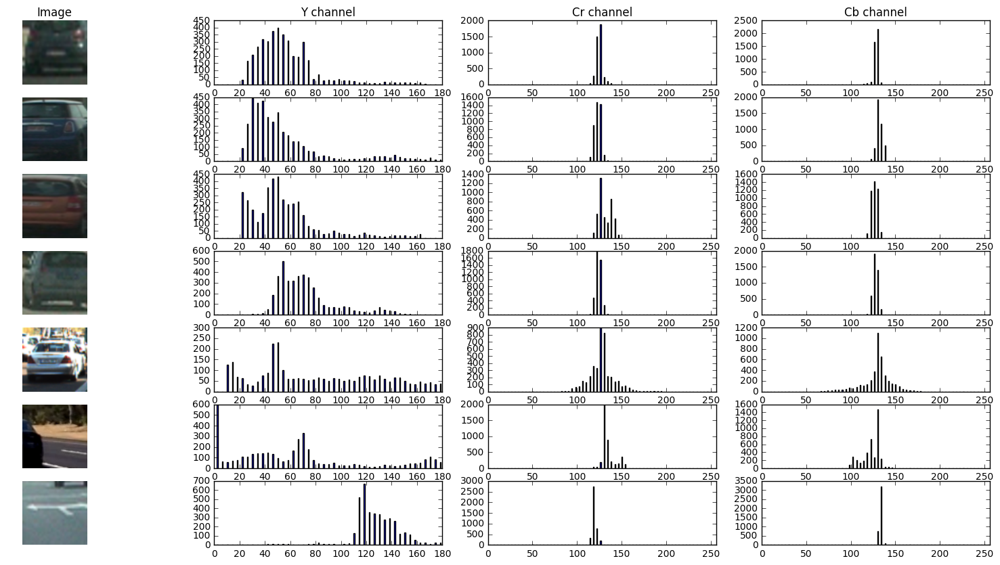

In [11]:
plt.figure(figsize = (20,10))
plt.subplot(7,4,1)
plt.title('Image')
plt.axis('off')
plt.imshow(img1)

plt.subplot(7,4,2)
plt.title('Y channel')
plt.bar(bin_center1, Yh1[0])
plt.xlim(0,180)

plt.subplot(7,4,3)
plt.title('Cr channel')
plt.bar(bin_center1, Crh1[0])
plt.xlim(0,256)

plt.subplot(7,4,4)
plt.title('Cb channel')
plt.bar(bin_center1, Cbh1[0])
plt.xlim(0,256)

plt.subplot(7,4,5)
plt.axis('off')
plt.imshow(img2)

plt.subplot(7,4,6)
plt.bar(bin_center2, Yh2[0])
plt.xlim(0,180)

plt.subplot(7,4,7)
plt.bar(bin_center2, Crh2[0])
plt.xlim(0,256)

plt.subplot(7,4,8)
plt.bar(bin_center2, Cbh2[0])
plt.xlim(0,256)

plt.subplot(7,4,9)
plt.axis('off')
plt.imshow(img3)

plt.subplot(7,4,10)
plt.bar(bin_center3, Yh3[0])
plt.xlim(0,180)

plt.subplot(7,4,11)
plt.bar(bin_center3, Crh3[0])
plt.xlim(0,256)

plt.subplot(7,4,12)
plt.bar(bin_center3, Cbh3[0])
plt.xlim(0,256)

plt.subplot(7,4,13)
plt.axis('off')
plt.imshow(img4)

plt.subplot(7,4,14)
plt.bar(bin_center4, Yh4[0])
plt.xlim(0,180)

plt.subplot(7,4,15)
plt.bar(bin_center4, Crh4[0])
plt.xlim(0,256)

plt.subplot(7,4,16)
plt.bar(bin_center4, Cbh4[0])
plt.xlim(0,256)

plt.subplot(7,4,17)
plt.axis('off')
plt.imshow(img5)

plt.subplot(7,4,18)
plt.bar(bin_center5, Yh5[0])
plt.xlim(0,180)

plt.subplot(7,4,19)
plt.bar(bin_center5, Crh5[0])
plt.xlim(0,256)

plt.subplot(7,4,20)
plt.bar(bin_center5, Cbh5[0])
plt.xlim(0,256)

plt.subplot(7,4,21)
plt.axis('off')
plt.imshow(img6)

plt.subplot(7,4,22)
plt.bar(bin_center6, Yh6[0])
plt.xlim(0,180)

plt.subplot(7,4,23)
plt.bar(bin_center6, Crh6[0])
plt.xlim(0,256)

plt.subplot(7,4,24)
plt.bar(bin_center6, Cbh6[0])
plt.xlim(0,256)

plt.subplot(7,4,25)
plt.axis('off')
plt.imshow(img7)

plt.subplot(7,4,26)
plt.bar(bin_center7, Yh7[0])
plt.xlim(0,180)

plt.subplot(7,4,27)
plt.bar(bin_center7, Crh7[0])
plt.xlim(0,256)

plt.subplot(7,4,28)
plt.bar(bin_center7, Cbh7[0])
plt.xlim(0,256)
plt.show()

In [12]:
Lh1, Uh1, Vh1, bin_center1, LUV_features1 = color_hist(img1, color_space = 'LUV')
Lh2, Uh2, Vh2, bin_center2, LUV_features2 = color_hist(img2, color_space = 'LUV')
Lh3, Uh3, Vh3, bin_center3, LUV_features3 = color_hist(img3, color_space = 'LUV')
Lh4, Uh4, Vh4, bin_center4, LUV_features4 = color_hist(img4, color_space = 'LUV')
Lh5, Uh5, Vh5, bin_center5, LUV_features5 = color_hist(img5, color_space = 'LUV')
Lh6, Uh6, Vh6, bin_center6, LUV_features6 = color_hist(img6, color_space = 'LUV')
Lh7, Uh7, Vh7, bin_center7, LUV_features7 = color_hist(img7, color_space = 'LUV')

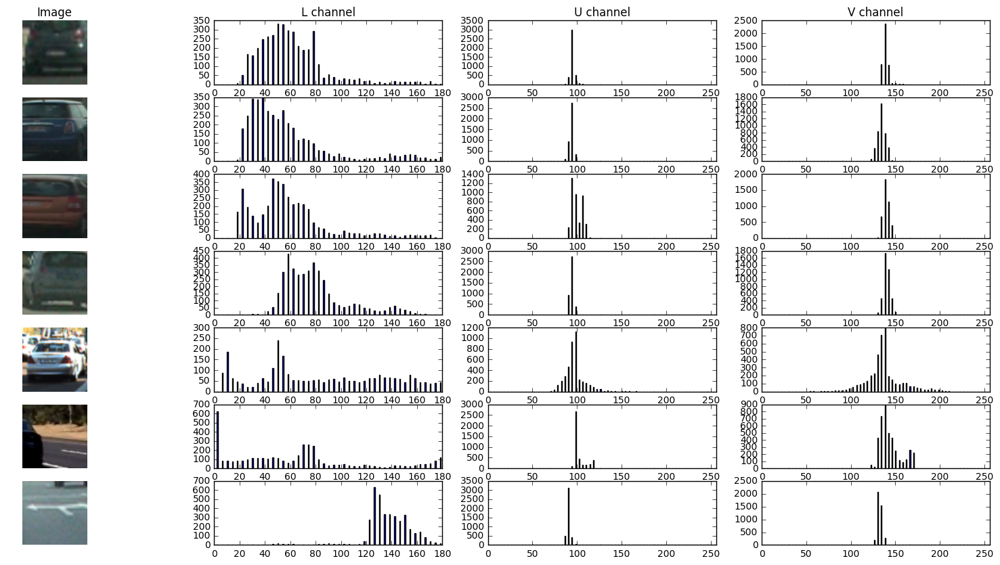

In [13]:
plt.figure(figsize = (20,10))
plt.subplot(7,4,1)
plt.title('Image')
plt.axis('off')
plt.imshow(img1)

plt.subplot(7,4,2)
plt.title('L channel')
plt.bar(bin_center1, Lh1[0])
plt.xlim(0,180)

plt.subplot(7,4,3)
plt.title('U channel')
plt.bar(bin_center1, Uh1[0])
plt.xlim(0,256)

plt.subplot(7,4,4)
plt.title('V channel')
plt.bar(bin_center1, Vh1[0])
plt.xlim(0,256)

plt.subplot(7,4,5)
plt.axis('off')
plt.imshow(img2)

plt.subplot(7,4,6)
plt.bar(bin_center2, Lh2[0])
plt.xlim(0,180)

plt.subplot(7,4,7)
plt.bar(bin_center2, Uh2[0])
plt.xlim(0,256)

plt.subplot(7,4,8)
plt.bar(bin_center2, Vh2[0])
plt.xlim(0,256)

plt.subplot(7,4,9)
plt.axis('off')
plt.imshow(img3)

plt.subplot(7,4,10)
plt.bar(bin_center3, Lh3[0])
plt.xlim(0,180)

plt.subplot(7,4,11)
plt.bar(bin_center3, Uh3[0])
plt.xlim(0,256)

plt.subplot(7,4,12)
plt.bar(bin_center3, Vh3[0])
plt.xlim(0,256)

plt.subplot(7,4,13)
plt.axis('off')
plt.imshow(img4)

plt.subplot(7,4,14)
plt.bar(bin_center4, Lh4[0])
plt.xlim(0,180)

plt.subplot(7,4,15)
plt.bar(bin_center4, Uh4[0])
plt.xlim(0,256)

plt.subplot(7,4,16)
plt.bar(bin_center4, Vh4[0])
plt.xlim(0,256)

plt.subplot(7,4,17)
plt.axis('off')
plt.imshow(img5)

plt.subplot(7,4,18)
plt.bar(bin_center5, Lh5[0])
plt.xlim(0,180)

plt.subplot(7,4,19)
plt.bar(bin_center5, Uh5[0])
plt.xlim(0,256)

plt.subplot(7,4,20)
plt.bar(bin_center5, Vh5[0])
plt.xlim(0,256)

plt.subplot(7,4,21)
plt.axis('off')
plt.imshow(img6)

plt.subplot(7,4,22)
plt.bar(bin_center6, Lh6[0])
plt.xlim(0,180)

plt.subplot(7,4,23)
plt.bar(bin_center6, Uh6[0])
plt.xlim(0,256)

plt.subplot(7,4,24)
plt.bar(bin_center6, Vh6[0])
plt.xlim(0,256)

plt.subplot(7,4,25)
plt.axis('off')
plt.imshow(img7)

plt.subplot(7,4,26)
plt.bar(bin_center7, Lh7[0])
plt.xlim(0,180)

plt.subplot(7,4,27)
plt.bar(bin_center7, Uh7[0])
plt.xlim(0,256)

plt.subplot(7,4,28)
plt.bar(bin_center7, Vh7[0])
plt.xlim(0,256)
plt.show()

In [14]:
Hh1, Lh1, Sh1, bin_center1, HLS_features1 = color_hist(img1, color_space = 'HLS')
Hh2, Lh2, Sh2, bin_center2, HLS_features2 = color_hist(img2, color_space = 'HLS')
Hh3, Lh3, Sh3, bin_center3, HLS_features3 = color_hist(img3, color_space = 'HLS')
Hh4, Lh4, Sh4, bin_center4, HLS_features4 = color_hist(img4, color_space = 'HLS')
Hh5, Lh5, Sh5, bin_center5, HLS_features5 = color_hist(img5, color_space = 'HLS')
Hh6, Lh6, Sh6, bin_center6, HLS_features6 = color_hist(img6, color_space = 'HLS')
Hh7, Lh7, Sh7, bin_center7, HLS_features7 = color_hist(img7, color_space = 'HLS')

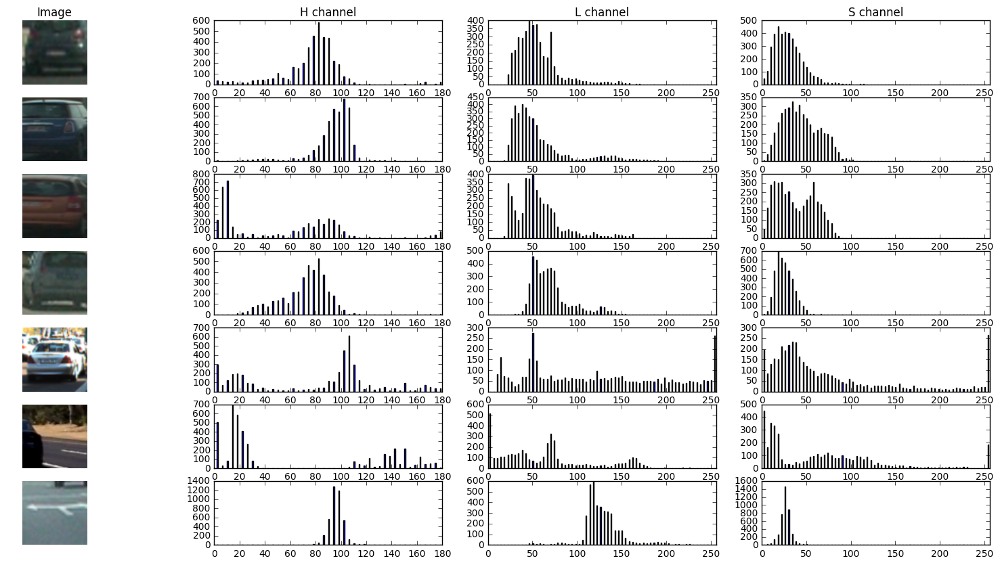

In [15]:
plt.figure(figsize = (20,10))
plt.subplot(7,4,1)
plt.title('Image')
plt.axis('off')
plt.imshow(img1)

plt.subplot(7,4,2)
plt.title('H channel')
plt.bar(bin_center1, Hh1[0])
plt.xlim(0,180)

plt.subplot(7,4,3)
plt.title('L channel')
plt.bar(bin_center1, Lh1[0])
plt.xlim(0,256)

plt.subplot(7,4,4)
plt.title('S channel')
plt.bar(bin_center1, Sh1[0])
plt.xlim(0,256)

plt.subplot(7,4,5)
plt.axis('off')
plt.imshow(img2)

plt.subplot(7,4,6)
plt.bar(bin_center2, Hh2[0])
plt.xlim(0,180)

plt.subplot(7,4,7)
plt.bar(bin_center2, Lh2[0])
plt.xlim(0,256)

plt.subplot(7,4,8)
plt.bar(bin_center2, Sh2[0])
plt.xlim(0,256)

plt.subplot(7,4,9)
plt.axis('off')
plt.imshow(img3)

plt.subplot(7,4,10)
plt.bar(bin_center3, Hh3[0])
plt.xlim(0,180)

plt.subplot(7,4,11)
plt.bar(bin_center3, Lh3[0])
plt.xlim(0,256)

plt.subplot(7,4,12)
plt.bar(bin_center3, Sh3[0])
plt.xlim(0,256)

plt.subplot(7,4,13)
plt.axis('off')
plt.imshow(img4)

plt.subplot(7,4,14)
plt.bar(bin_center4, Hh4[0])
plt.xlim(0,180)

plt.subplot(7,4,15)
plt.bar(bin_center4, Lh4[0])
plt.xlim(0,256)

plt.subplot(7,4,16)
plt.bar(bin_center4, Sh4[0])
plt.xlim(0,256)

plt.subplot(7,4,17)
plt.axis('off')
plt.imshow(img5)

plt.subplot(7,4,18)
plt.bar(bin_center5, Hh5[0])
plt.xlim(0,180)

plt.subplot(7,4,19)
plt.bar(bin_center5, Lh5[0])
plt.xlim(0,256)

plt.subplot(7,4,20)
plt.bar(bin_center5, Sh5[0])
plt.xlim(0,256)

plt.subplot(7,4,21)
plt.axis('off')
plt.imshow(img6)

plt.subplot(7,4,22)
plt.bar(bin_center6, Hh6[0])
plt.xlim(0,180)

plt.subplot(7,4,23)
plt.bar(bin_center6, Lh6[0])
plt.xlim(0,256)

plt.subplot(7,4,24)
plt.bar(bin_center6, Sh6[0])
plt.xlim(0,256)

plt.subplot(7,4,25)
plt.axis('off')
plt.imshow(img7)

plt.subplot(7,4,26)
plt.bar(bin_center7, Hh7[0])
plt.xlim(0,180)

plt.subplot(7,4,27)
plt.bar(bin_center7, Lh7[0])
plt.xlim(0,256)

plt.subplot(7,4,28)
plt.bar(bin_center7, Sh7[0])
plt.xlim(0,256)
plt.show()

In [16]:
def bin_spatial(feature_image, color_space = 'RGB', size = (32,32)):
    if color_space != 'RGB':
        if color_space == 'HSV':
            #print('Converting to HSV.....')
            feature_image = cv2.cvtColor(feature_image, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            #print('Converting to LUV.....')
            feature_image = cv2.cvtColor(feature_image, cv2.COLOR_RGB2LUV)
        elif color_space == 'YCrCb':
            #print('Converting to YCrCb.....')
            feature_image = cv2.cvtColor(feature_image, cv2.COLOR_RGB2YCrCb)
        elif color_space == 'HLS':
            #print('Converting to HLS.....')
            feature_image = cv2.cvtColor(feature_image, cv2.COLOR_RGB2HLS)
    features = cv2.resize(feature_image, size).ravel()
    return features

In [17]:
feature_vec1 = bin_spatial(img1, color_space='RGB', size=(32, 32))
feature_vec2 = bin_spatial(img2, color_space='RGB', size=(32, 32))
feature_vec3 = bin_spatial(img3, color_space='RGB', size=(32, 32))
feature_vec4 = bin_spatial(img4, color_space='RGB', size=(32, 32))
feature_vec5 = bin_spatial(img5, color_space='RGB', size=(32, 32))
feature_vec6 = bin_spatial(img6, color_space='RGB', size=(32, 32))
feature_vec7 = bin_spatial(img7, color_space='RGB', size=(32, 32))

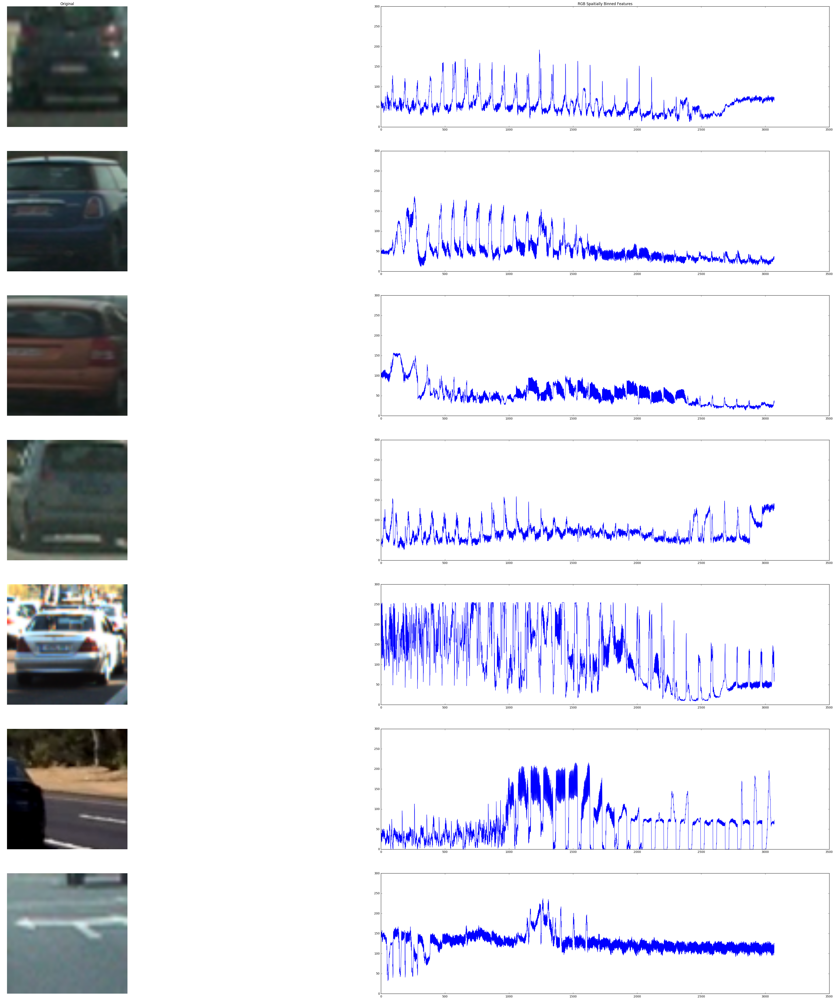

In [18]:
plt.figure(figsize = (60,60))
plt.subplot(7,2,1)
plt.imshow(img1)
plt.title('Original')
plt.axis('off')
plt.subplot(7,2,2)
plt.title('RGB Spaitially Binned Features')
plt.ylim(0,300)
plt.plot(feature_vec1)

plt.subplot(7,2,3)
plt.imshow(img2)
plt.axis('off')
plt.subplot(7,2,4)
plt.ylim(0,300)
plt.plot(feature_vec2)

plt.subplot(7,2,5)
plt.imshow(img3)
plt.axis('off')
plt.subplot(7,2,6)
plt.ylim(0,300)
plt.plot(feature_vec3)

plt.subplot(7,2,7)
plt.imshow(img4)
plt.axis('off')
plt.subplot(7,2,8)
plt.ylim(0,300)
plt.plot(feature_vec4)

plt.subplot(7,2,9)
plt.imshow(img5)
plt.axis('off')
plt.subplot(7,2,10)
plt.ylim(0,300)
plt.plot(feature_vec5)

plt.subplot(7,2,11)
plt.imshow(img6)
plt.axis('off')
plt.subplot(7,2,12)
plt.ylim(0,300)
plt.plot(feature_vec6)

plt.subplot(7,2,13)
plt.imshow(img7)
plt.axis('off')
plt.subplot(7,2,14)
plt.ylim(0,300)
plt.plot(feature_vec7)
plt.show()

In [19]:
feature_vec1 = bin_spatial(img1, color_space='HSV', size=(32, 32))
feature_vec2 = bin_spatial(img2, color_space='HSV', size=(32, 32))
feature_vec3 = bin_spatial(img3, color_space='HSV', size=(32, 32))
feature_vec4 = bin_spatial(img4, color_space='HSV', size=(32, 32))
feature_vec5 = bin_spatial(img5, color_space='HSV', size=(32, 32))
feature_vec6 = bin_spatial(img6, color_space='HSV', size=(32, 32))
feature_vec7 = bin_spatial(img7, color_space='HSV', size=(32, 32))

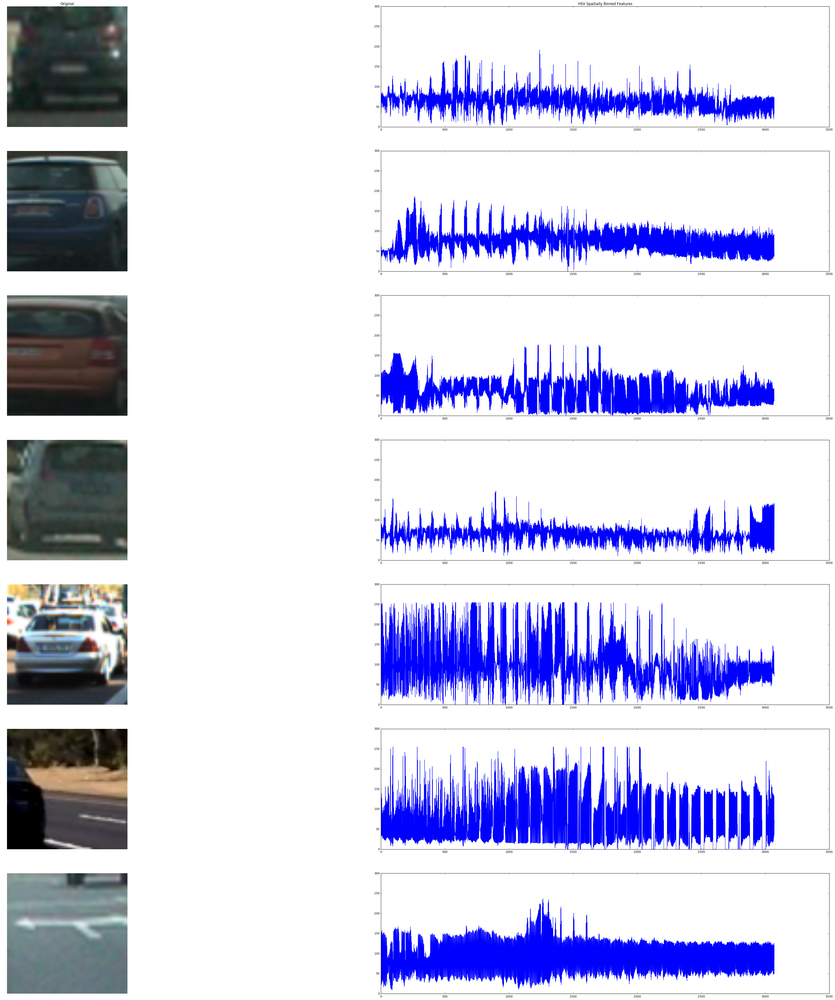

In [20]:
plt.figure(figsize = (60,60))
plt.subplot(7,2,1)
plt.imshow(img1)
plt.title('Original')
plt.axis('off')
plt.subplot(7,2,2)
plt.title('HSV Spaitially Binned Features')
plt.ylim(0,300)
plt.plot(feature_vec1)

plt.subplot(7,2,3)
plt.imshow(img2)
plt.axis('off')
plt.subplot(7,2,4)
plt.ylim(0,300)
plt.plot(feature_vec2)

plt.subplot(7,2,5)
plt.imshow(img3)
plt.axis('off')
plt.subplot(7,2,6)
plt.ylim(0,300)
plt.plot(feature_vec3)

plt.subplot(7,2,7)
plt.imshow(img4)
plt.axis('off')
plt.subplot(7,2,8)
plt.ylim(0,300)
plt.plot(feature_vec4)

plt.subplot(7,2,9)
plt.imshow(img5)
plt.axis('off')
plt.subplot(7,2,10)
plt.ylim(0,300)
plt.plot(feature_vec5)

plt.subplot(7,2,11)
plt.imshow(img6)
plt.axis('off')
plt.subplot(7,2,12)
plt.ylim(0,300)
plt.plot(feature_vec6)

plt.subplot(7,2,13)
plt.imshow(img7)
plt.axis('off')
plt.subplot(7,2,14)
plt.ylim(0,300)
plt.plot(feature_vec7)
plt.show()

In [21]:
feature_vec1 = bin_spatial(img1, color_space='HLS', size=(32, 32))
feature_vec2 = bin_spatial(img2, color_space='HLS', size=(32, 32))
feature_vec3 = bin_spatial(img3, color_space='HLS', size=(32, 32))
feature_vec4 = bin_spatial(img4, color_space='HLS', size=(32, 32))
feature_vec5 = bin_spatial(img5, color_space='HLS', size=(32, 32))
feature_vec6 = bin_spatial(img6, color_space='HLS', size=(32, 32))
feature_vec7 = bin_spatial(img7, color_space='HLS', size=(32, 32))

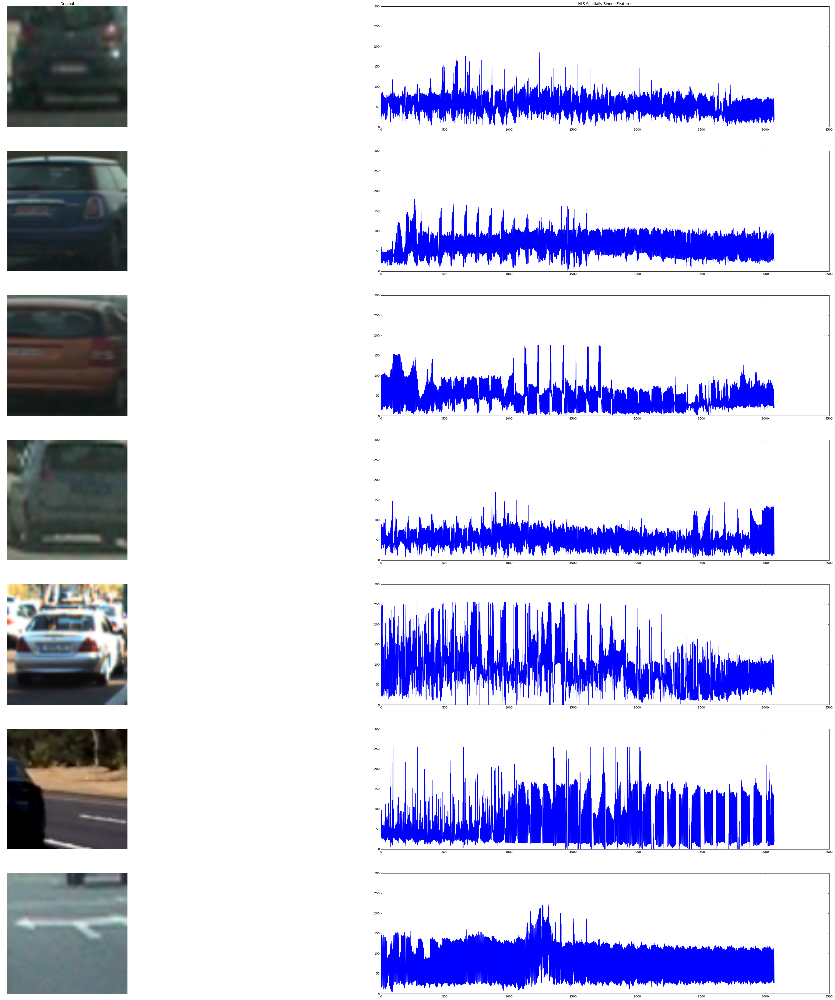

In [22]:
plt.figure(figsize = (60,60))
plt.subplot(7,2,1)
plt.imshow(img1)
plt.title('Original')
plt.axis('off')
plt.subplot(7,2,2)
plt.title('HLS Spaitially Binned Features')
plt.ylim(0,300)
plt.plot(feature_vec1)

plt.subplot(7,2,3)
plt.imshow(img2)
plt.axis('off')
plt.subplot(7,2,4)
plt.ylim(0,300)
plt.plot(feature_vec2)

plt.subplot(7,2,5)
plt.imshow(img3)
plt.axis('off')
plt.subplot(7,2,6)
plt.ylim(0,300)
plt.plot(feature_vec3)

plt.subplot(7,2,7)
plt.imshow(img4)
plt.axis('off')
plt.subplot(7,2,8)
plt.ylim(0,300)
plt.plot(feature_vec4)

plt.subplot(7,2,9)
plt.imshow(img5)
plt.axis('off')
plt.subplot(7,2,10)
plt.ylim(0,300)
plt.plot(feature_vec5)

plt.subplot(7,2,11)
plt.imshow(img6)
plt.axis('off')
plt.subplot(7,2,12)
plt.ylim(0,300)
plt.plot(feature_vec6)

plt.subplot(7,2,13)
plt.imshow(img7)
plt.axis('off')
plt.subplot(7,2,14)
plt.ylim(0,300)
plt.plot(feature_vec7)
plt.show()

In [23]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis = False, feature_vec = True):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if vis == True:
        features, hog_image = hog(img, orientations = orient,
                                 pixels_per_cell = (pix_per_cell, pix_per_cell),
                                 cells_per_block = (cell_per_block, cell_per_block),
                                 visualise = True, feature_vector = True)
        return features, hog_image
    else:
        features = hog(img, orientations = orient,
                      pixels_per_cell = (pix_per_cell, pix_per_cell),
                      cells_per_block = (cell_per_block, cell_per_block),
                      visualise = False, feature_vector = feature_vec)
        return features

In [24]:
pix_per_cell = 8
cell_per_block = 2
orient = 9

In [25]:
hog_features1, hog1 = get_hog_features(img1, orient, pix_per_cell, cell_per_block, vis = True, feature_vec = True)
hog_features2, hog2 = get_hog_features(img2, orient, pix_per_cell, cell_per_block, vis = True, feature_vec = True)
hog_features3, hog3 = get_hog_features(img3, orient, pix_per_cell, cell_per_block, vis = True, feature_vec = True)
hog_features4, hog4 = get_hog_features(img4, orient, pix_per_cell, cell_per_block, vis = True, feature_vec = True)
hog_features5, hog5 = get_hog_features(img5, orient, pix_per_cell, cell_per_block, vis = True, feature_vec = True)
hog_features6, hog6 = get_hog_features(img6, orient, pix_per_cell, cell_per_block, vis = True, feature_vec = True)
hog_features7, hog7 = get_hog_features(img7, orient, pix_per_cell, cell_per_block, vis = True, feature_vec = True)

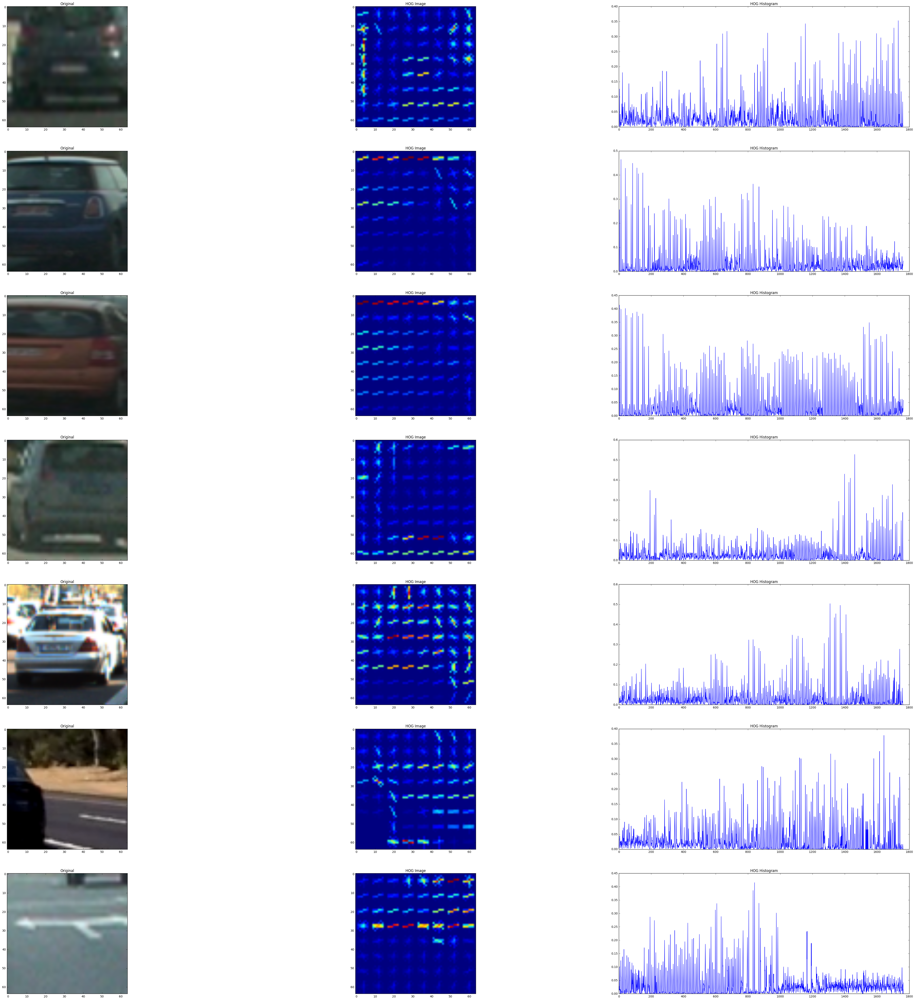

In [26]:
plt.figure(figsize = (60,60))
plt.subplot(7,3,1)
plt.imshow(img1, cmap = 'gray')
plt.title('Original')
plt.subplot(7,3,2)
plt.title('HOG Image')
plt.imshow(hog1)
plt.subplot(7,3,3)
plt.title('HOG Histogram')
plt.plot(hog_features1)

plt.subplot(7,3,4)
plt.imshow(img2, cmap = 'gray')
plt.title('Original')
plt.subplot(7,3,5)
plt.title('HOG Image')
plt.imshow(hog2)
plt.subplot(7,3,6)
plt.title('HOG Histogram')
plt.plot(hog_features2)

plt.subplot(7,3,7)
plt.imshow(img3, cmap = 'gray')
plt.title('Original')
plt.subplot(7,3,8)
plt.title('HOG Image')
plt.imshow(hog3)
plt.subplot(7,3,9)
plt.title('HOG Histogram')
plt.plot(hog_features3)

plt.subplot(7,3,10)
plt.imshow(img4, cmap = 'gray')
plt.title('Original')
plt.subplot(7,3,11)
plt.title('HOG Image')
plt.imshow(hog4)
plt.subplot(7,3,12)
plt.title('HOG Histogram')
plt.plot(hog_features4)

plt.subplot(7,3,13)
plt.imshow(img5, cmap = 'gray')
plt.title('Original')
plt.subplot(7,3,14)
plt.title('HOG Image')
plt.imshow(hog5)
plt.subplot(7,3,15)
plt.title('HOG Histogram')
plt.plot(hog_features5)

plt.subplot(7,3,16)
plt.imshow(img6, cmap = 'gray')
plt.title('Original')
plt.subplot(7,3,17)
plt.title('HOG Image')
plt.imshow(hog6)
plt.subplot(7,3,18)
plt.title('HOG Histogram')
plt.plot(hog_features6)

plt.subplot(7,3,19)
plt.imshow(img7, cmap = 'gray')
plt.title('Original')
plt.subplot(7,3,20)
plt.title('HOG Image')
plt.imshow(hog7)
plt.subplot(7,3,21)
plt.title('HOG Histogram')
plt.plot(hog_features7)

plt.show()

In [84]:
def features_combine(img, orient, pix_per_cell, cell_per_block, size = (32,32), 
                     spatial_feat = True, hist_feat = True, hog_feat = True):
    X = []
    if spatial_feat == True:
        spatial_feature = bin_spatial(img, color_space='HSV', size=(32, 32))
        X.append(spatial_feature)
    if hist_feat == True:
        ch1, ch2, ch3, bin_cen, histogram_feature = color_hist(img, color_space = 'HSV')
        X.append(histogram_feature)
    if hog_feat == True:
        hog_feature = get_hog_features(img, orient, pix_per_cell, cell_per_block, vis = False, feature_vec = True)
        X.append(hog_feature)
    feature = np.concatenate(X)
    
    return feature

In [85]:
x1 = features_combine(img1, orient, pix_per_cell, cell_per_block, size = (32,32))
x2 = features_combine(img2, orient, pix_per_cell, cell_per_block, size = (32,32))
x3 = features_combine(img3, orient, pix_per_cell, cell_per_block, size = (32,32))
x4 = features_combine(img4, orient, pix_per_cell, cell_per_block, size = (32,32))
x5 = features_combine(img5, orient, pix_per_cell, cell_per_block, size = (32,32))
x6 = features_combine(img6, orient, pix_per_cell, cell_per_block, size = (32,32))
x7 = features_combine(img7, orient, pix_per_cell, cell_per_block, size = (32,32))

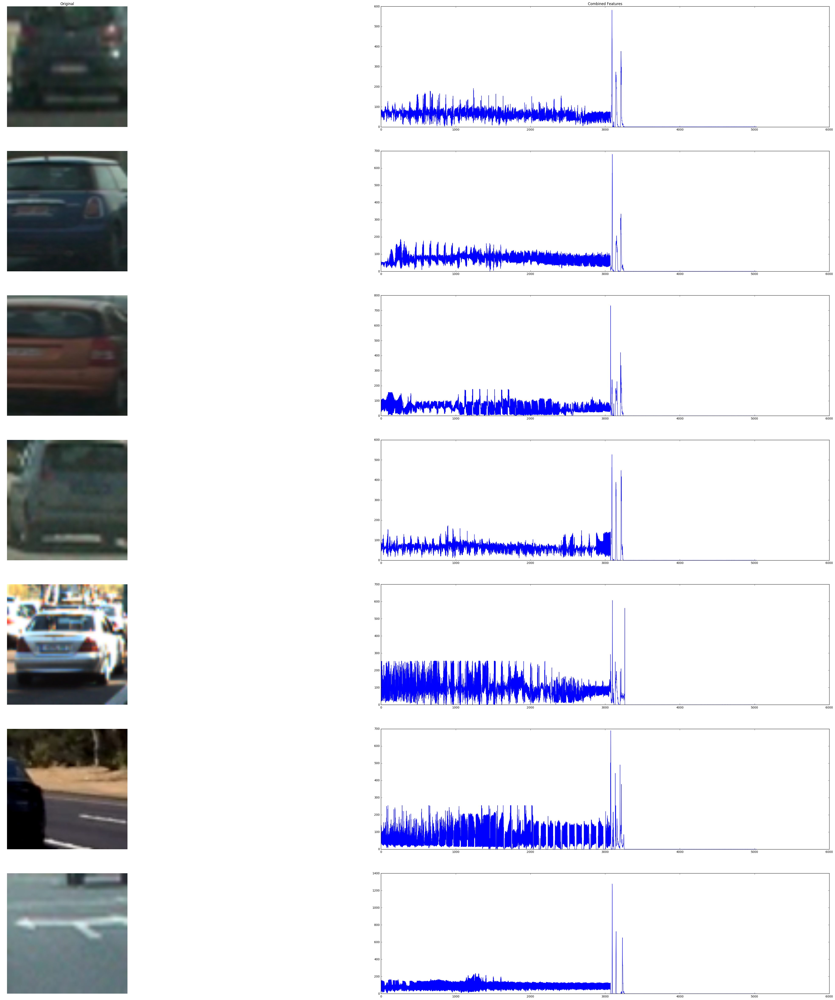

In [86]:
plt.figure(figsize = (60,60))
plt.subplot(7,2,1)
plt.imshow(img1)
plt.title('Original')
plt.axis('off')
plt.subplot(7,2,2)
plt.title('Combined Features')
plt.plot(x1)

plt.subplot(7,2,3)
plt.imshow(img2)
plt.axis('off')
plt.subplot(7,2,4)
plt.plot(x2)

plt.subplot(7,2,5)
plt.imshow(img3)
plt.axis('off')
plt.subplot(7,2,6)
plt.plot(x3)

plt.subplot(7,2,7)
plt.imshow(img4)
plt.axis('off')
plt.subplot(7,2,8)
plt.plot(x4)

plt.subplot(7,2,9)
plt.imshow(img5)
plt.axis('off')
plt.subplot(7,2,10)
plt.plot(x5)

plt.subplot(7,2,11)
plt.imshow(img6)
plt.axis('off')
plt.subplot(7,2,12)
plt.plot(x6)

plt.subplot(7,2,13)
plt.imshow(img7)
plt.axis('off')
plt.subplot(7,2,14)
plt.plot(x7)
plt.show()

In [87]:
vehicle       = []
non_vehicle   = []
X_vehicle     = []
X_non_vehicle = [] 
vehicle.extend(GTI_Far_vehicles + GTI_Left_vehicles + GTI_MiddleClose_vehicles + GTI_Right_vehicles + KITTI_extracted_vehicles)
non_vehicle.extend(Extra_non_vehicles + GTI_non_vehicles)

In [88]:
for path in vehicle:
    img = cv2.imread(path)
    X = features_combine(img, orient, pix_per_cell, cell_per_block, size = (32,32))
    X_vehicle.append(X)

In [89]:
for path in non_vehicle:
    img = cv2.imread(path)
    X = features_combine(img, orient, pix_per_cell, cell_per_block, size = (32,32))
    X_non_vehicle.append(X)

In [90]:
X = np.vstack((X_vehicle, X_non_vehicle)).astype(np.float64)
X_scaler = StandardScaler().fit(X)
scaled_X = X_scaler.transform(X)

y = np.hstack((np.ones(len(X_vehicle)), np.zeros(len(X_non_vehicle))))

In [91]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=50)

In [92]:
clf = LinearSVC(max_iter = 2000)
t=time.time()
clf.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')

33.16 Seconds to train SVC...


In [93]:
acc = clf.score(X_test, y_test)
print('acc for test set is: ', acc)

acc for test set is:  0.961993243243


In [39]:
def draw_boxes(img, bboxes, color = (0,0,255), thick = 6):
    imcopy = np.copy(img)
    for bbox in bboxes:
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    return imcopy

def slide_window(img, x_start_stop = [None, None], y_start_stop = [None, None], xy_window = (64,64), xy_overlap = (0.5,0.5)):
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
        
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    nx_pix_per_step = np.int(xy_window[0] * (1-xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1] * (1-xy_overlap[1]))
    
    nx_buffer = np.int(xy_window[0] * xy_overlap[0])
    ny_buffer = np.int(xy_window[1] * xy_overlap[1])
    
    nx_windows = np.int((xspan - nx_buffer)/ nx_pix_per_step)
    ny_windows = np.int((yspan - ny_buffer)/ ny_pix_per_step)
    
    window_list = []
    
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            window_list.append(((startx, starty), (endx, endy)))
    return window_list

In [266]:
test_img = cv2.imread('test_images/test1.jpg')
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)

In [274]:
all_window = []
windows = slide_window(test_img, x_start_stop=[None, None], y_start_stop=[350, None], 
                     xy_window=(np.int(test_img.shape[1]/6), 200), xy_overlap=(0.75, 0.75))
windows2 = slide_window(test_img, x_start_stop=[None, None], y_start_stop=[350, None], 
                    xy_window=(np.int(test_img.shape[1]/8), 180), xy_overlap=(0.75, 0.75))
#windows4 = slide_window(test_img, x_start_stop=[None, None], y_start_stop=[350, None], 
                #    xy_window=(np.int(test_img.shape[1]/10), 120), xy_overlap=(0.5, 0.5))
#windows6 = slide_window(test_img, x_start_stop=[None, None], y_start_stop=[350, None], 
                 #   xy_window=(np.int(test_img.shape[1]/12), 80), xy_overlap=(0.5, 0.5))

#all_window = windows2
all_window.extend((windows+windows2))

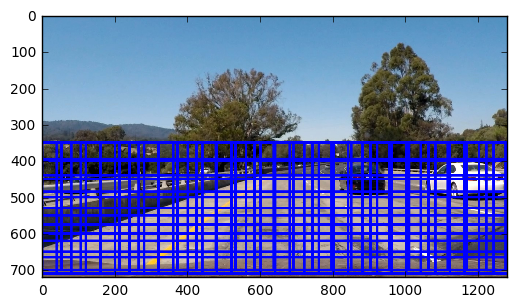

In [275]:
out_img = draw_boxes(test_img, all_window, color=(0, 0, 255), thick=6) 
plt.imshow(out_img)
plt.show()

In [276]:
def search_windows(img, windows, clf, scaler,
                   spatial_size = (32,32), hist_bins = 32, hist_range = (0,256),
                  orient = 9, pix_per_cell = 8, cell_per_block = 2):
    pos_window = []
    
    for window in windows:
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64,64))
        features = features_combine(test_img, orient, pix_per_cell, cell_per_block, size = (32,32))
        test_features = scaler.transform(np.array(features).reshape(1,-1))
        prediction = clf.predict(test_features)
        if prediction == 1:
            pos_window.append(window)
    return pos_window

In [277]:
test_window = search_windows(test_img, all_window, clf, X_scaler)

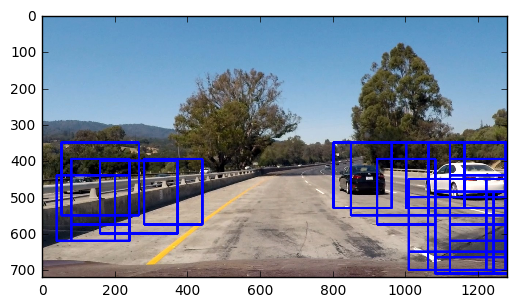

In [278]:
out_img = draw_boxes(test_img, test_window, color=(0, 0, 255), thick=6) 
plt.imshow(out_img)
plt.show()

In [279]:
def add_heat(heatmap, bbox_list):
    for box in bbox_list:
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
    return heatmap

def apply_threshold(heatmap, threshold):
    heatmap[heatmap <= threshold] = 0
    return heatmap
    

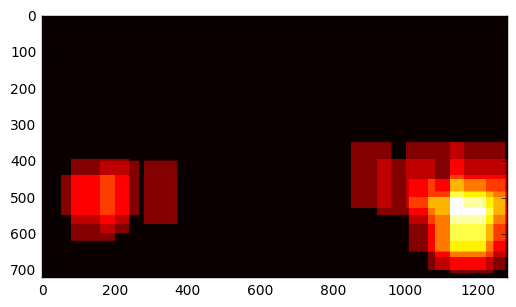

In [280]:
heatmap = np.zeros_like(test_img[:,:,0]).astype(np.float)

heat = add_heat(heatmap, test_window)
heat = apply_threshold(heat, 1)
heatmap = np.clip(heat, 0, 255)

plt.imshow(heatmap, cmap = 'hot')
plt.show()

In [281]:
labels = label(heatmap)

In [282]:
def draw_labeled_bboxes(img, labels):
    print('There are ' ,labels[1], ' car(s) in the image')
    imcopy = np.copy(img)
    for car_number in range (1, labels[1]+1):
        nonzero = (labels[0] == car_number).nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        cv2.rectangle(imcopy, bbox[0], bbox[1], (0,0,255), 6)
    return imcopy

There are  3  car(s) in the image


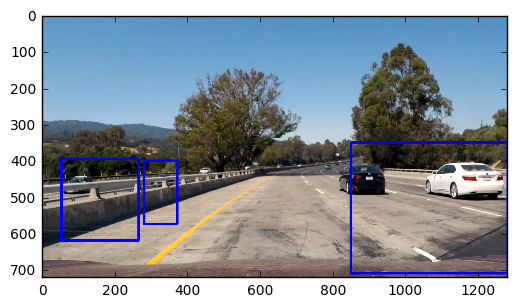

In [283]:
car_img = draw_labeled_bboxes(test_img, labels)
plt.imshow(car_img)
plt.show()